## Analitica Computacional para la toma de Decisiones
## Proyecto 1 - Bicicletas compartidas
Carlos Gomez - 202111593
<br>
Jeronimo Vargas - 202113305
<br>
Juan Esteban Lopez - 202021417
<br>

In [95]:
import pandas as pd # type: ignore
import matplotlib.pyplot as plt # type: ignore
import seaborn as sns # type: ignore
from ydata_profiling import ProfileReport # type: ignore
%matplotlib inline

# Load the data
data = pd.read_csv('SeoulBikeData_utf8.csv')
data.head()

,Date,Rented Bike Count,Hour,Temperature(C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,01/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,01/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,01/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,01/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes


In [96]:
data.shape

(8760, 14)

### Estadisticas descriptivas

In [97]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 14 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Date                      8760 non-null   object 
 1   Rented Bike Count         8760 non-null   int64  
 2   Hour                      8760 non-null   int64  
 3   Temperature(C)            8760 non-null   float64
 4   Humidity(%)               8760 non-null   int64  
 5   Wind speed (m/s)          8760 non-null   float64
 6   Visibility (10m)          8760 non-null   int64  
 7   Dew point temperature(C)  8760 non-null   float64
 8   Solar Radiation (MJ/m2)   8760 non-null   float64
 9   Rainfall(mm)              8760 non-null   float64
 10  Snowfall (cm)             8760 non-null   float64
 11  Seasons                   8760 non-null   object 
 12  Holiday                   8760 non-null   object 
 13  Functioning Day           8760 non-null   object 
dtypes: float

In [98]:
data.describe()

,Rented Bike Count,Hour,Temperature(C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm)
count,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000
mean,704.602055,11.500000,12.882922,58.226256,1.724909,1436.825799,4.073813,0.569111,0.148687,0.075068
std,644.997468,6.922582,11.944825,20.362413,1.036300,608.298712,13.060369,0.868746,1.128193,0.436746
min,0.000000,0.000000,-17.800000,0.000000,0.000000,27.000000,-30.600000,0.000000,0.000000,0.000000
25%,191.000000,5.750000,3.500000,42.000000,0.900000,940.000000,-4.700000,0.000000,0.000000,0.000000
50%,504.500000,11.500000,13.700000,57.000000,1.500000,1698.000000,5.100000,0.010000,0.000000,0.000000
75%,1065.250000,17.250000,22.500000,74.000000,2.300000,2000.000000,14.800000,0.930000,0.000000,0.000000
max,3556.000000,23.000000,39.400000,98.000000,7.400000,2000.000000,27.200000,3.520000,35.000000,8.800000


In [99]:
data.isnull().sum()

Date                        0
Rented Bike Count           0
Hour                        0
Temperature(C)              0
Humidity(%)                 0
Wind speed (m/s)            0
Visibility (10m)            0
Dew point temperature(C)    0
Solar Radiation (MJ/m2)     0
Rainfall(mm)                0
Snowfall (cm)               0
Seasons                     0
Holiday                     0
Functioning Day             0
dtype: int64

In [100]:
data.duplicated().sum()

np.int64(0)

### Perfilamiento de datos

In [101]:
profile = ProfileReport(data, title='Pandas Profiling Report', explorative=True)
profile.to_file("SeoulBikeData.html")
# Show profilereport
profile



Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

### Manejo variables categoricas

In [102]:
# Binary encoding para holiday and function day
data['Holiday'] = data['Holiday'].map({'No Holiday': 0, 'Holiday': 1})
data['Functioning Day'] = data['Functioning Day'].map({'No': 0, 'Yes': 1})

# One hot encoding para seasons
dataNew = pd.get_dummies(data, columns=['Seasons'], drop_first=True)
# Type of data

# Replace bool for binary in Seasons_Spring, Seasons_Summer, Seasons_Winter
dataNew['Seasons_Spring'] = dataNew['Seasons_Spring'].astype('int')
dataNew['Seasons_Summer'] = dataNew['Seasons_Summer'].astype('int')
dataNew['Seasons_Winter'] = dataNew['Seasons_Winter'].astype('int')

dataNew.head()

,Date,Rented Bike Count,Hour,Temperature(C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Holiday,Functioning Day,Seasons_Spring,Seasons_Summer,Seasons_Winter
0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,0,1,0,0,1
1,01/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,0,1,0,0,1
2,01/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,0,1,0,0,1
3,01/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,0,1,0,0,1
4,01/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,0,1,0,0,1


In [103]:
profile2 = ProfileReport(dataNew, title='Pandas Profiling Report', explorative=True)
profile2.to_file("SeoulBikeDataNew.html")
# Show profilereport
profile2

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

### Antes se decide continuir sin la variable "Date", se considera que no aporta informacion sobre la temporalidad, ya que hay variables como "Hour" y "Season" que puede representar informacion sobre el comprtamiento de la variable Rented Bike Count. 

### Correlacion con Rented Bike Count

<Axes: >

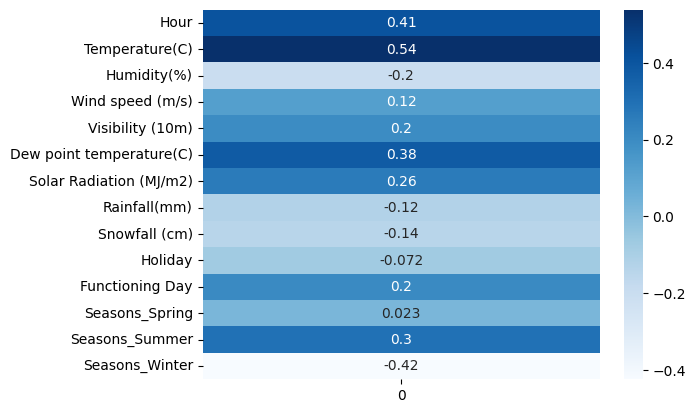

In [104]:
dataNew = dataNew.drop(['Date'], axis=1)
corrw = dataNew.drop(['Rented Bike Count'], axis=1).corrwith(data['Rented Bike Count'])
sns.heatmap(pd.DataFrame(corrw), cmap="Blues", annot=True)

## Estadisticas Descriptivas

In [105]:
dataNew.describe()

,Rented Bike Count,Hour,Temperature(C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Holiday,Functioning Day,Seasons_Spring,Seasons_Summer,Seasons_Winter
count,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000
mean,704.602055,11.500000,12.882922,58.226256,1.724909,1436.825799,4.073813,0.569111,0.148687,0.075068,0.049315,0.966324,0.252055,0.252055,0.246575
std,644.997468,6.922582,11.944825,20.362413,1.036300,608.298712,13.060369,0.868746,1.128193,0.436746,0.216537,0.180404,0.434217,0.434217,0.431042
min,0.000000,0.000000,-17.800000,0.000000,0.000000,27.000000,-30.600000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,191.000000,5.750000,3.500000,42.000000,0.900000,940.000000,-4.700000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
50%,504.500000,11.500000,13.700000,57.000000,1.500000,1698.000000,5.100000,0.010000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
75%,1065.250000,17.250000,22.500000,74.000000,2.300000,2000.000000,14.800000,0.930000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000
max,3556.000000,23.000000,39.400000,98.000000,7.400000,2000.000000,27.200000,3.520000,35.000000,8.800000,1.000000,1.000000,1.000000,1.000000,1.000000


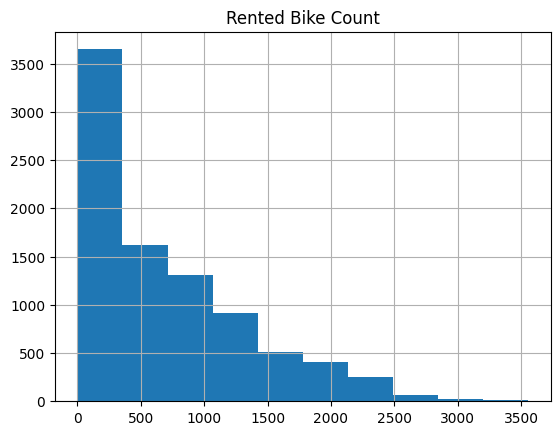

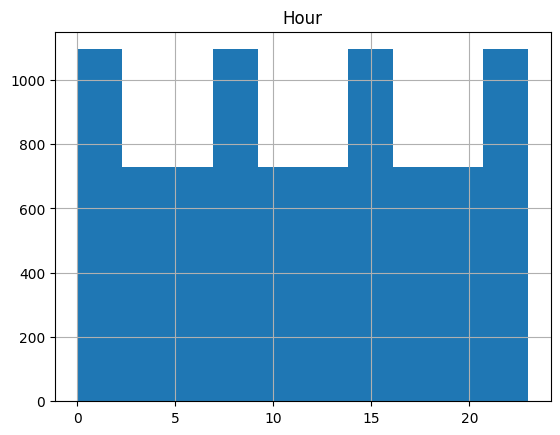

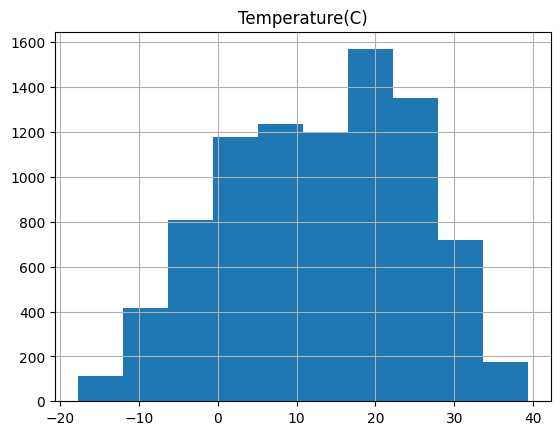

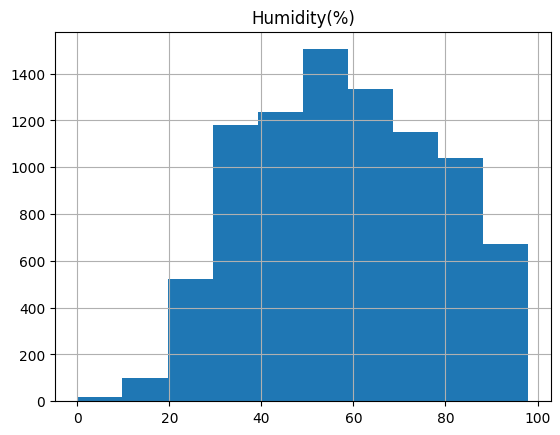

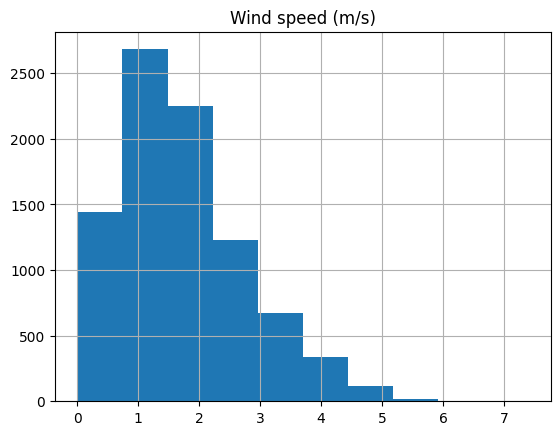

...

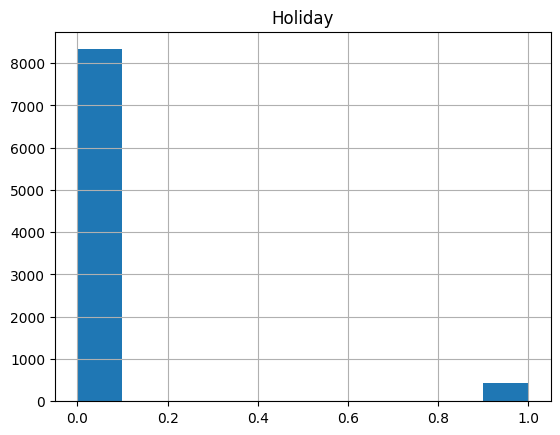

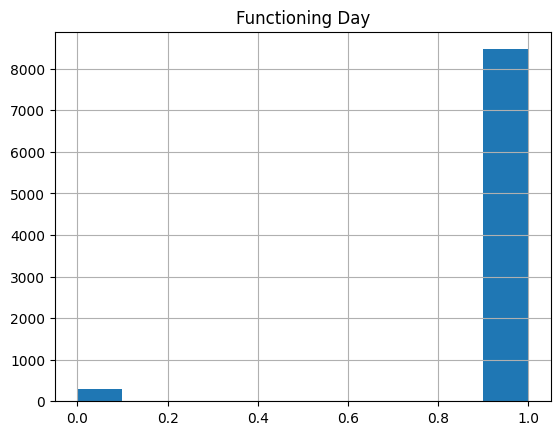

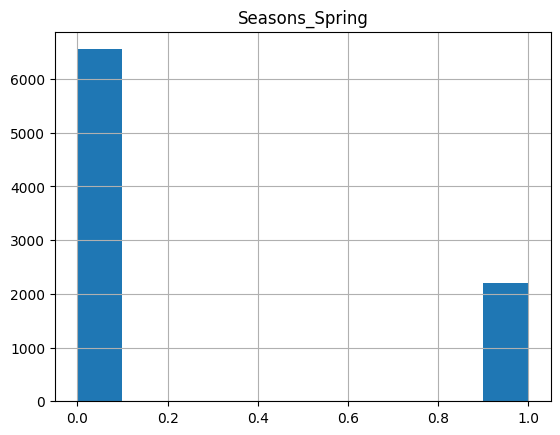

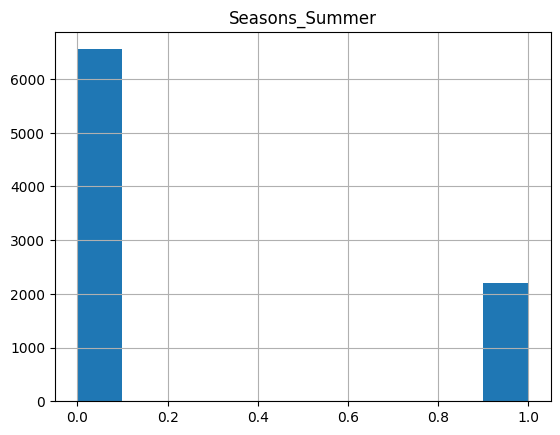

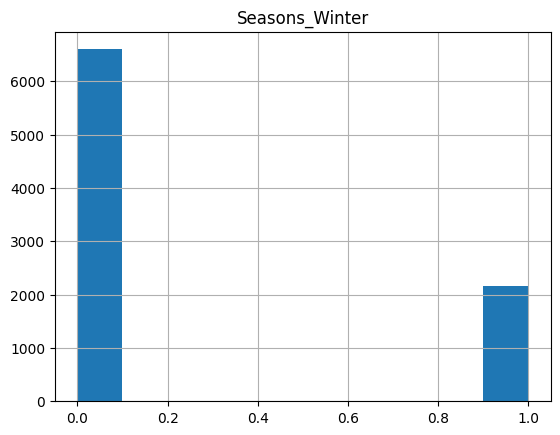

In [106]:
for i in dataNew.columns:
    dataNew[i].hist()
    plt.title(i)
    plt.show()

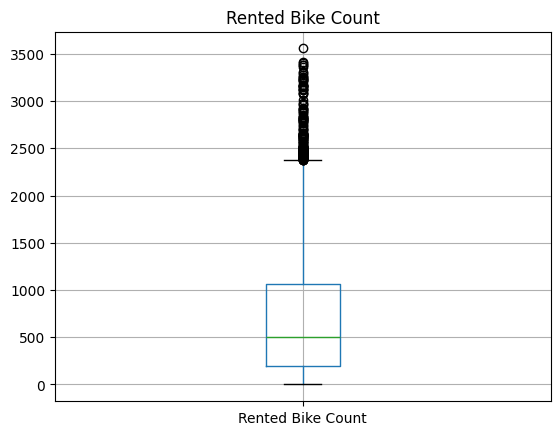

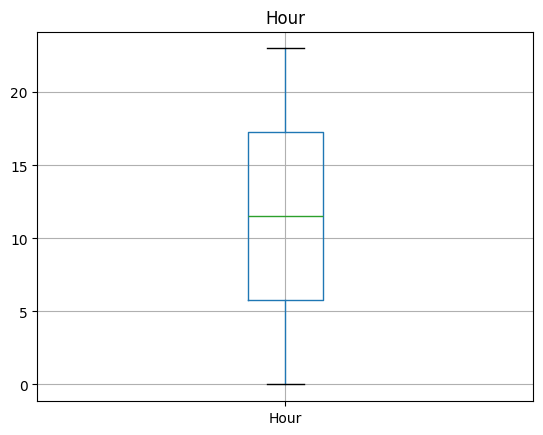

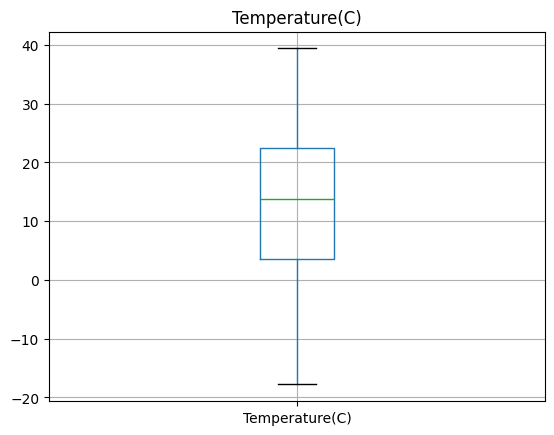

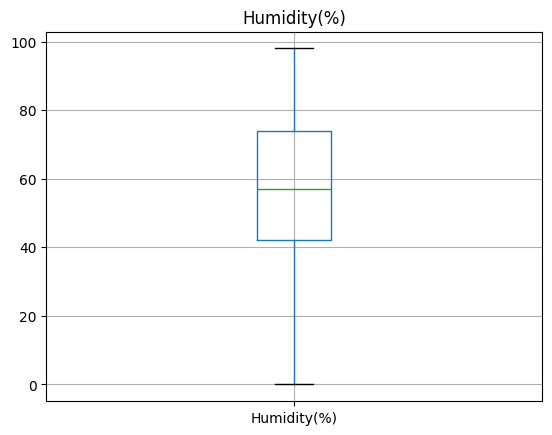

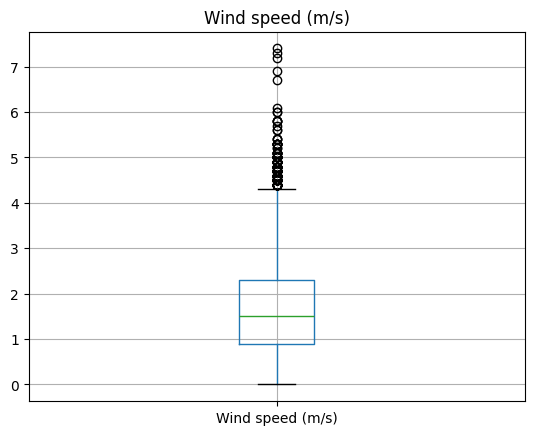

...

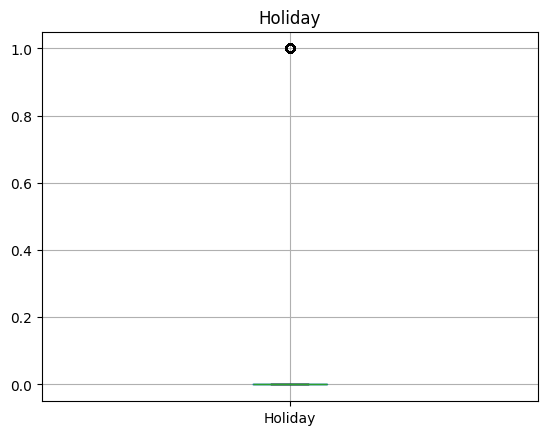

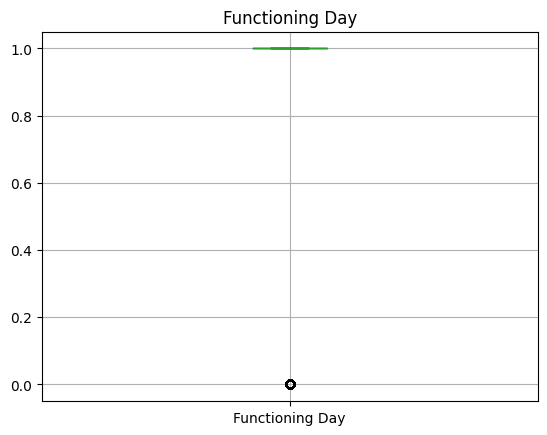

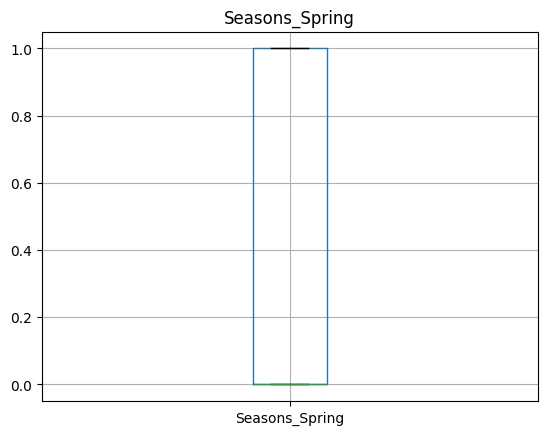

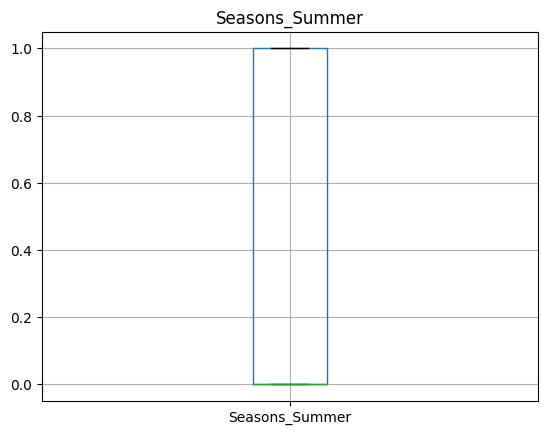

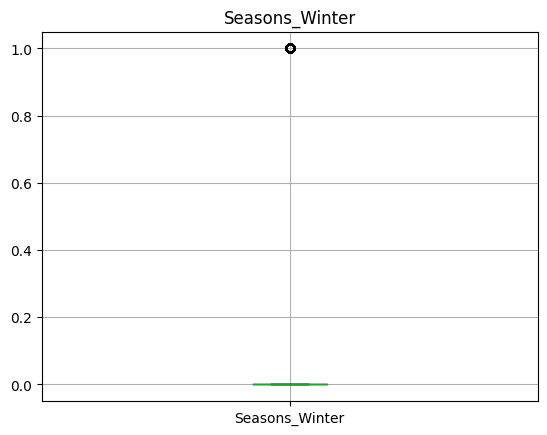

In [107]:
# Diagrama de cajas
for i in dataNew.columns:
    dataNew.boxplot(column=i)
    plt.title(i)
    plt.show()

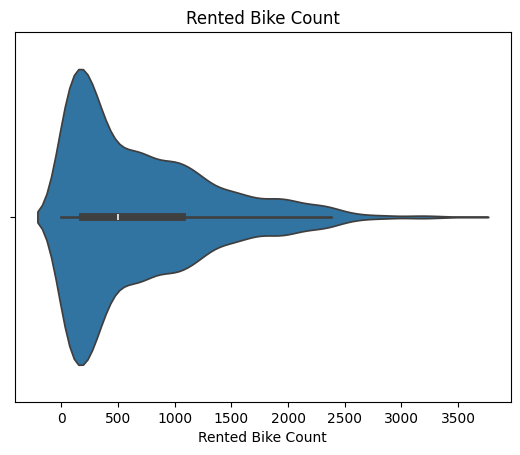

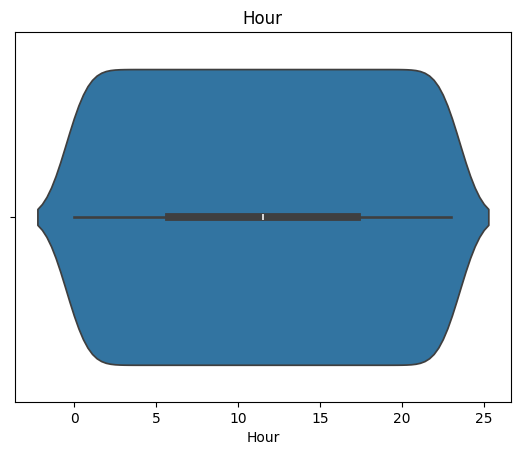

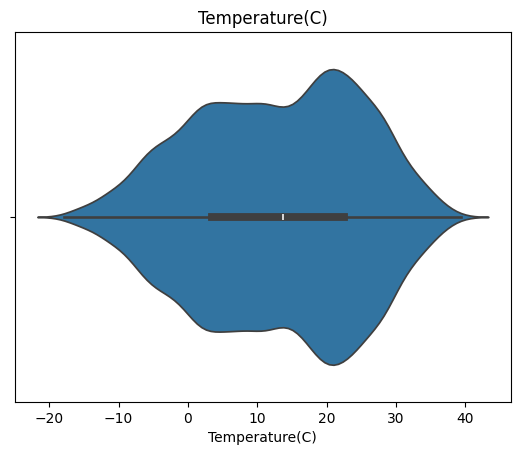

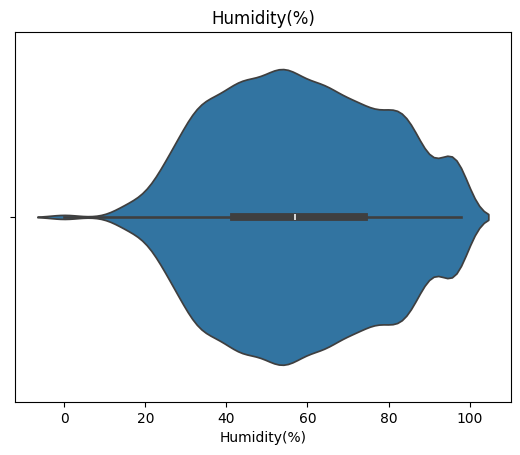

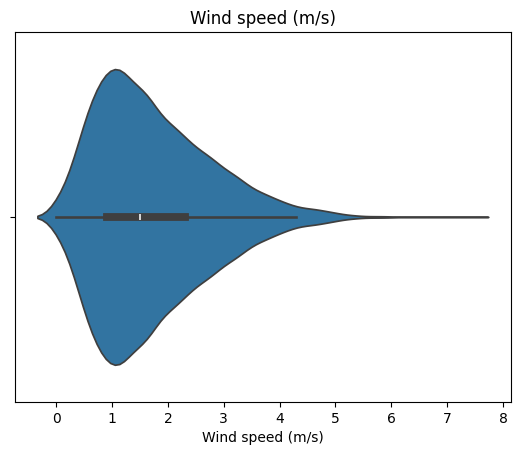

...

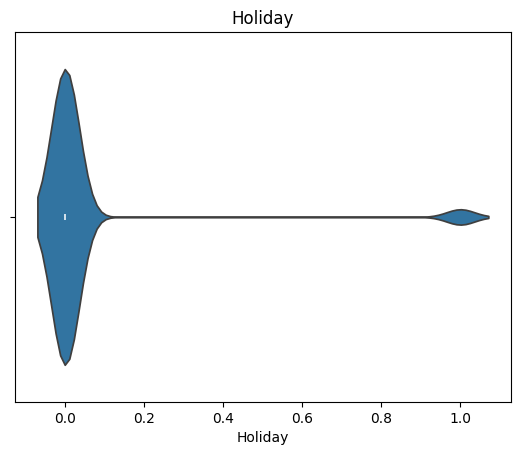

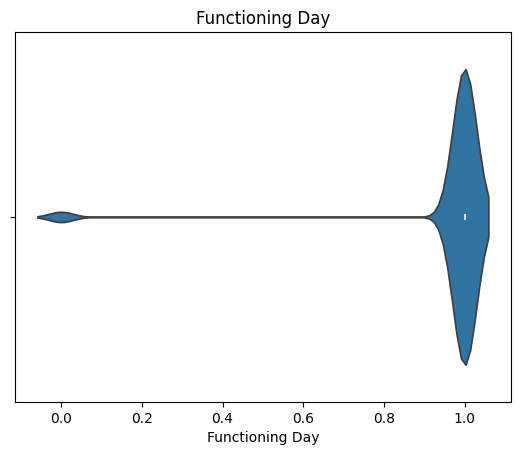

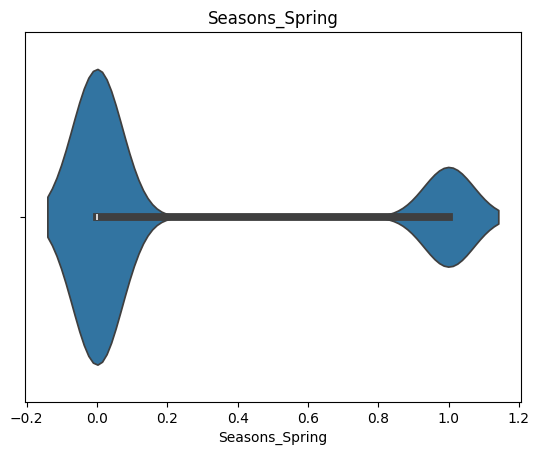

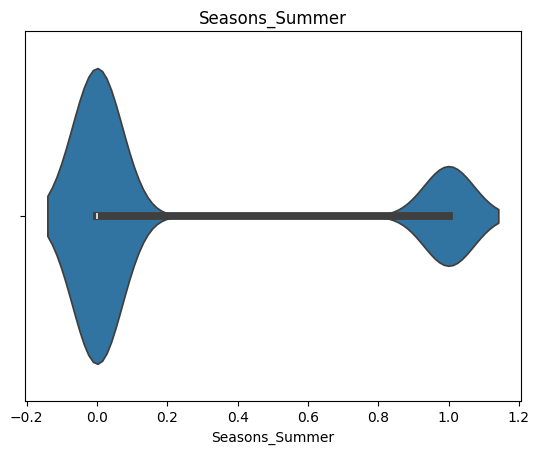

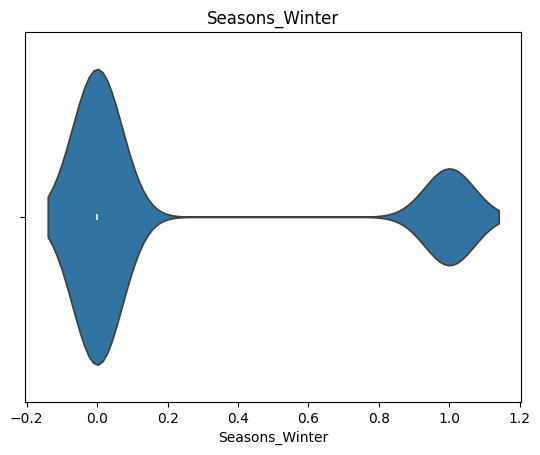

In [108]:
# Diagramas de violín
for i in dataNew.columns:
    sns.violinplot(data=dataNew, x=i)
    plt.title(i)
    plt.show()

### Diagramas de dispersión y tendencia entre variables de entrada y variable de respuesta

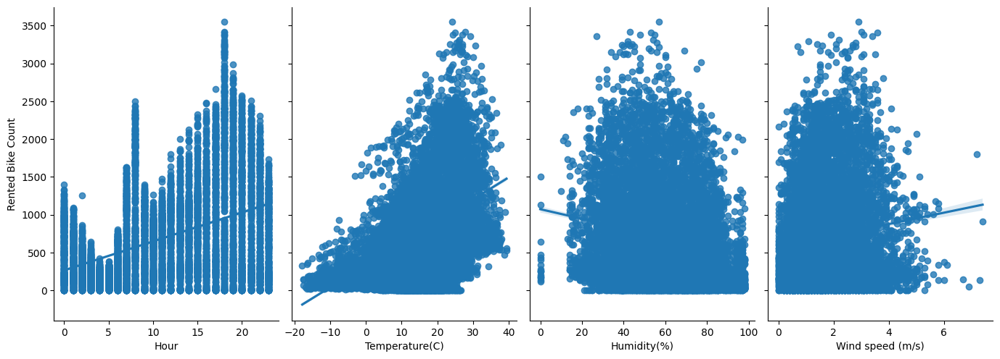

In [109]:
import seaborn as sns
sns.pairplot(dataNew, x_vars=['Hour', 'Temperature(C)', 'Humidity(%)', 'Wind speed (m/s)'], y_vars='Rented Bike Count', height=5, aspect=0.7, kind='reg')

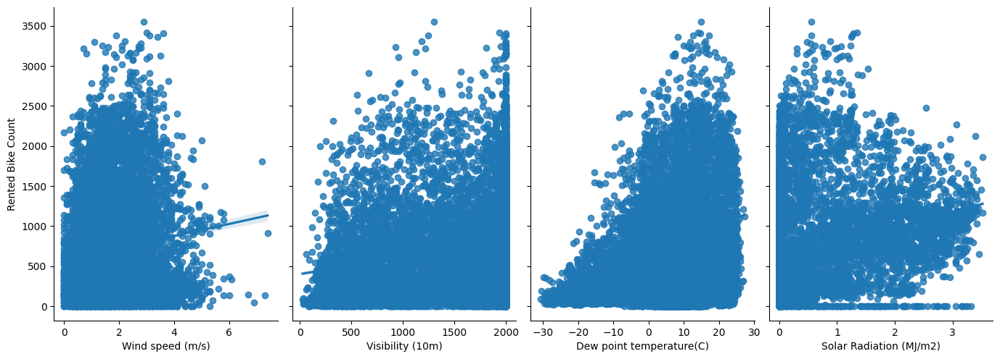

In [110]:
import seaborn as sns
sns.pairplot(dataNew, x_vars=["Wind speed (m/s)","Visibility (10m)","Dew point temperature(C)","Solar Radiation (MJ/m2)"], y_vars=['Rented Bike Count'], height=5, aspect=0.7, kind='reg')

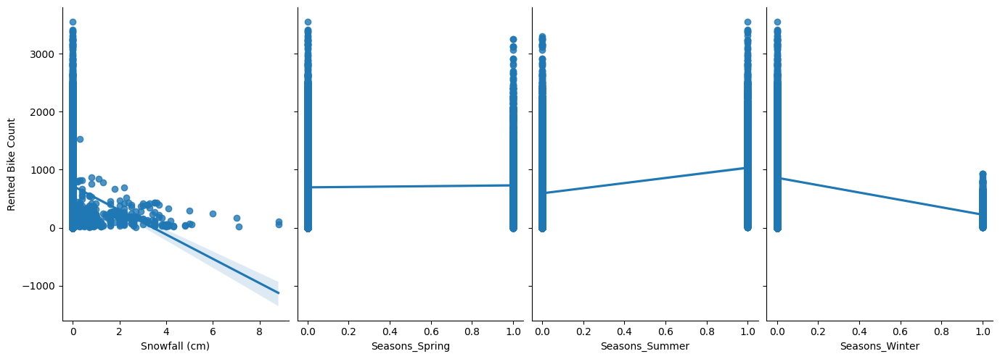

In [111]:
import seaborn as sns
sns.pairplot(dataNew, x_vars=['Snowfall (cm)', 'Seasons_Spring', 'Seasons_Summer', 'Seasons_Winter'], y_vars='Rented Bike Count', height=5, aspect=0.7, kind='reg')


In [112]:
# Guardar CSV con datos limpios
dataNew.to_csv('SeoulBikeDataClean.csv', index=False)